# Présentation des résultats

Chargement des Packages nécessaires

In [207]:
using CSV
using Plots
using DataFrames
using DataFramesMeta
using Dates
using StatsPlots
using Statistics
using Temporal
using GLM
using TimeSeries: TimeArray 
using StatsBase
using Forecast
using LinearAlgebra
using Optim

Données

In [208]:

# Fonction pour lire et filtrer les données
function read_and_filter_data(filepath, date_column::Symbol, value_column::Symbol, header_row::Int, skip_rows::Int)
    df = CSV.read(filepath, DataFrame, header = header_row, skipto = skip_rows, comment = "#", dateformat = "yyyymmdd", types = Dict(date_column => Date), normalizenames = true)
    df_filtered = filter(row -> year(row[date_column]) >= 1955 && year(row[date_column]) <= 2005, df)
    return df_filtered
end

# Lire tous les fichiers dans un dossier et agréger les données
function aggregate_data_from_folder(folder_path::String, date_column::Symbol, value_column::Symbol, header_row::Int, skip_rows::Int)
    files = readdir(folder_path)
    all_data = DataFrame()
    
    for file in files
        filepath = joinpath(folder_path, file)
        df = read_and_filter_data(filepath, date_column, value_column, header_row, skip_rows)
        append!(all_data, df)
    end
    
    # Supprimer les valeurs manquantes
    all_data = filter(row -> row[value_column] != 9, all_data)
    
    # Calculer la moyenne et l'écart type pour chaque date
    
    if value_column == :Tmax
        aggregated_data = @chain all_data begin
            @transform(:YEAR = year.(all_data[!, date_column])) # Ajouter une colonne pour l'année
            @by(date_column, :DAILY_MEAN = mean(:Tmax), :DAILY_STD = std(:Tmax)) # Grouper par date et calculer moyenne / écart type
        end
    else
        aggregated_data = @chain all_data begin
            @subset(:Q_TX .!= 9) # Supprimer les valeurs manquantes 
            @transform(:YEAR = year.(:DATE)) # Ajouter une colonne pour l'année
            @by(date_column, :DAILY_MEAN = mean(:TX), :DAILY_STD = std(:TX)) # Grouper par date et calculer moyenne / écart type
        end
    end

    return aggregated_data
end

# Chemins des dossiers
data_station_folder = "data_station_extract_script/data_tx"
data_drias_folder = "data_drias/Mod1_temp"
data_mod2_folder = "data_drias/Mod2_temp"

# Agréger les données des dossiers
data_station_aggregated = aggregate_data_from_folder(data_station_folder, :DATE, :TX, 21, 22)
data_drias_aggregated = aggregate_data_from_folder(data_drias_folder, :Date, :Tmax, 60, 61)
data_mod2_aggregated = aggregate_data_from_folder(data_mod2_folder, :Date, :Tmax, 59, 60)

# Conversion factor to °C for data_station
factor = 0.1
data_station_aggregated[!, :DAILY_MEAN] .= data_station_aggregated[!, :DAILY_MEAN] * factor
data_station_aggregated[!, :DAILY_STD] .= data_station_aggregated[!, :DAILY_STD] * factor

# Trier les données par date
sort!(data_station_aggregated, :DATE)
sort!(data_drias_aggregated, :Date)
sort!(data_mod2_aggregated, :Date)

df_daily = data_station_aggregated  
df_daily_drias = data_drias_aggregated
df_daily_mod2 = data_mod2_aggregated

# Convertir les données en séries temporelles
my_ts = TimeArray(data_station_aggregated[!, :DATE], data_station_aggregated[!, :DAILY_MEAN])
my_ts_drias = TimeArray(data_drias_aggregated[!, :Date], data_drias_aggregated[!, :DAILY_MEAN])
my_ts_mod2 = TimeArray(data_mod2_aggregated[!, :Date], data_mod2_aggregated[!, :DAILY_MEAN])

# Extraire les valeurs numériques de la série temporelle
data_values = values(my_ts)
data_values_drias = values(my_ts_drias)
data_values_mod2 = values(my_ts_mod2)


18628-element Vector{Float64}:
  7.0520000000000005
  7.844
 11.021333333333333
  8.73
  8.5
  8.681333333333333
  9.596000000000002
 10.592666666666668
 11.183333333333332
 10.991999999999999
  ⋮
 10.541333333333334
 11.546666666666669
 10.711333333333334
  9.318666666666667
  4.968666666666667
  4.450666666666666
  6.736
  6.284666666666667
  5.757333333333334

## Premières Analyses

### Autocorrélogrammes

AUTOCORRÉLOGRAMME PARTIEL


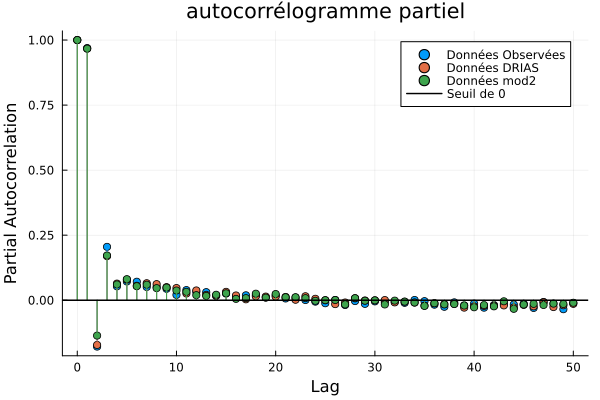

In [167]:
# Calculer l'autocorrélogramme partiel avec un nombre maximal de décalages spécifié
maxlag = 50 # Définir le nombre maximal de décalages
lags = collect(0:maxlag) # Créer une plage de décalages
pacf_values = StatsBase.pacf(data_values, lags)
pacf_values_drias = StatsBase.pacf(data_values_drias, lags)
pacf_values_mod2 = StatsBase.pacf(data_values_mod2, lags)

plot(0:maxlag, pacf_values, label = "Données Observées", xlabel="Lag", ylabel="Partial Autocorrelation", title="autocorrélogramme partiel", markershape=:circle, line=:stem)
plot!(0:maxlag, pacf_values_drias, label = "Données DRIAS", markershape=:circle, line=:stem)
plot!(0:maxlag, pacf_values_mod2, label = "Données mod2", markershape=:circle, line=:stem)
hline!([0], color=:black, linewidth=1.5, label = "Seuil de 0")

AUTOCORRÉLOGRAMME EMPIRIQUE

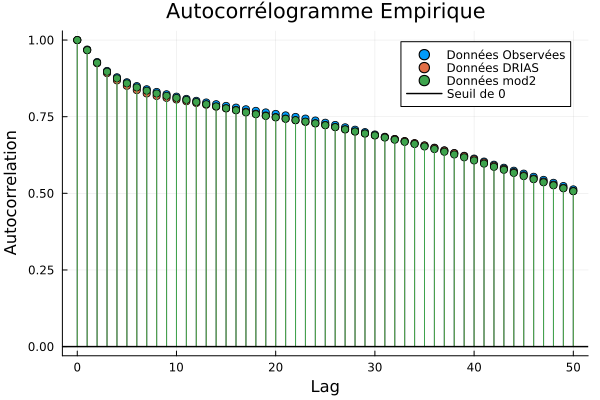

In [168]:
autocor_values = autocor(data_values, lags)
autocor_values_drias = autocor(data_values_drias, lags)
autocor_values_mod2 = autocor(data_values_mod2, lags)

# Tracer l'autocorrélogramme empirique avec les points reliés à l'axe des abscisses et une droite d'équation nulle
plot(0:maxlag, autocor_values, label = "Données Observées", xlabel="Lag", ylabel="Autocorrelation", title="Autocorrélogramme Empirique", markershape=:circle, line=:stem)
plot!(0:maxlag, autocor_values_drias, label = "Données DRIAS", markershape=:circle, line=:stem)
plot!(0:maxlag, autocor_values_mod2, label = "Données mod2", markershape=:circle, line=:stem)
hline!([0], color=:black, linewidth=1.5, label = "Seuil de 0")

### Séries temporelles et tendances

Tracé des deux avec moyennes mobiles classiques

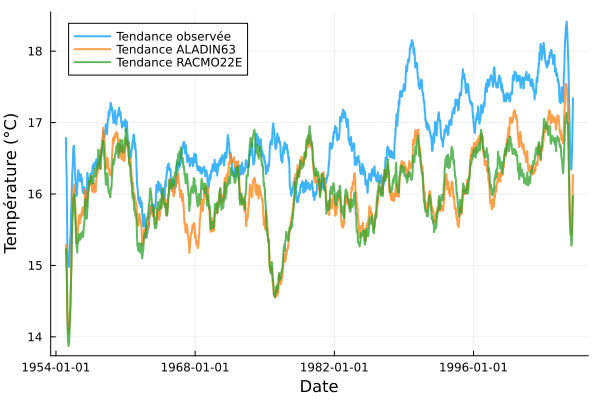

In [169]:
function moyenne_mobile(data::Vector{T}, window_size::Int) where T
    n = length(data)
    trend = similar(data, T)
    for i in 1:n
        start_idx = max(1, i - window_size ÷ 2)
        end_idx = min(n, i + window_size ÷ 2)
        trend[i] = mean(@view(data[start_idx:end_idx]))
    end
    return trend
end

# Calculer la tendance par moyenne mobile avec une fenêtre de taille 730 (deux ans)
trend_values = moyenne_mobile(df_daily.DAILY_MEAN, 731)
trend_values_drias = moyenne_mobile(df_daily_drias.DAILY_MEAN, 731)
trend_values_mod2 = moyenne_mobile(df_daily_mod2.DAILY_MEAN, 731)

# Convertir les données en une série temporelle
datats = TimeArray(df_daily.DATE, df_daily.DAILY_MEAN)
datats_drias = TimeArray(df_daily_drias.Date, df_daily_drias.DAILY_MEAN)
datats_mod2 = TimeArray(df_daily_mod2.Date, df_daily_mod2.DAILY_MEAN)

# Tracer la série temporelle avec la tendance
#plot(datats,  alpha=:0.5,label="Série temporelle observée", xlabel="Date", ylabel="Température (°C)")
#plot(datats_drias, color=:darkorange,  palette =:tab10, alpha=:0.5, label="Série temporelle ALADIN63", xlabel="Date", ylabel="Température (°C)")
#plot(datats_mod2,  color=:green, palette =:tab10, alpha=:0.5, label="Série temporelle RACMO22E", xlabel="Date", ylabel="Température (°C)")
plot(df_daily.DATE, alpha=:0.75, trend_values, label="Tendance observée", linewidth=2, xlabel="Date", ylabel="Température (°C)")
plot!(df_daily_drias.Date,  palette =:tab10, alpha=:0.75, trend_values_drias, label="Tendance ALADIN63", linewidth=2)
plot!(df_daily_mod2.Date, palette =:tab10, alpha=:0.75, trend_values_mod2, label="Tendance RACMO22E", linewidth=2)
#savefig("Tendances_moyenne-mobile.pdf")


Tracé des deux avec moyennes mobiles gaussien


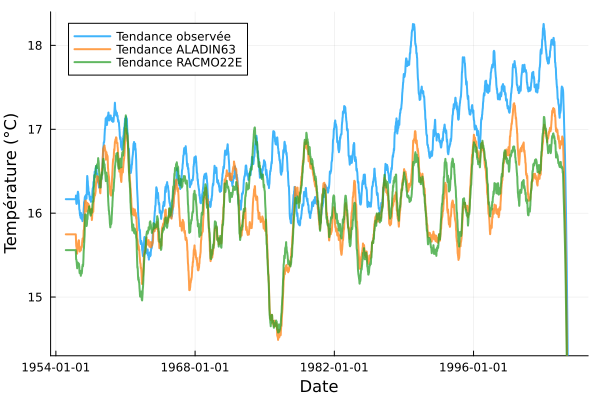

In [170]:

function moyenne_gauss(data::Vector{T}, window_size::Int) where T
    n = length(data)
    trend = similar(data, T)
    for i in 1:n
        weights = exp.(-(collect(1:window_size) .- (window_size ÷ 2)).^2 / (2 * (window_size / 2)^2))
        weights /= sum(weights)  # Normalisation des poids pour que leur somme soit égale à 1
        start_idx = max(1, i - window_size ÷ 2)
        end_idx = min(n, start_idx + window_size - 1)  # Ajustement de la fin de la tranche de données
        data_slice = @view(data[start_idx:end_idx])
        trend[i] = sum(data_slice .* weights[1:length(data_slice)])
    end
    return trend
end

# Calculer la tendance par moyenne mobile avec une fenêtre de taille 731 (deux ans)
trend_gauss = moyenne_gauss(df_daily.DAILY_MEAN, 731)
trend_gauss_drias = moyenne_gauss(df_daily_drias.DAILY_MEAN, 731)
trend_gauss_mod2 = moyenne_gauss(df_daily_mod2.DAILY_MEAN, 731)

# Tracer la série temporelle avec la tendance

plot(df_daily.DATE, alpha=:0.75,trend_gauss, label="Tendance observée", linewidth=2, xlabel="Date", ylabel="Température (°C)")
plot!(df_daily_drias.Date, palette =:tab10,alpha=:0.75, trend_gauss_drias, label="Tendance ALADIN63 ", linewidth=2)
plot!(df_daily_mod2.Date, alpha=:0.75, trend_gauss_mod2, label="Tendance RACMO22E", linewidth=2)
ylims!(14.3,18.4)
#savefig("Tendances_gaussien.pdf")


Décomposition de la série avec le package Forecast

In [171]:
stl_df = stl(df_daily,731; robust=true, spm=true)
stl_df_drias = stl(df_daily_drias,731; robust=true, spm=true)
stl_df_mod2 = stl(df_daily_mod2,731; robust=true, spm=true)
stl_df.decomposition
stl_df_drias.decomposition
stl_df_mod2.decomposition

┌ Info: Corvengence achieved (< 0.01); Stopping computation...
└ @ Forecast /Users/mario/.julia/packages/Forecast/Pu4g0/src/stl.jl:165
┌ Info: Corvengence achieved (< 0.01); Stopping computation...
└ @ Forecast /Users/mario/.julia/packages/Forecast/Pu4g0/src/stl.jl:165
┌ Info: Corvengence achieved (< 0.01); Stopping computation...
└ @ Forecast /Users/mario/.julia/packages/Forecast/Pu4g0/src/stl.jl:165


,Timestamp,Seasonal,Trend,Remainder
,Date,Float64,Float64,Float64
1,1955-01-01,-7.84793,15.5547,-0.654781
2,1955-01-02,-7.86446,15.5538,0.154678
3,1955-01-03,-7.88316,15.5528,3.35164
4,1955-01-04,-7.90392,15.5519,1.08199
5,1955-01-05,-7.9266,15.551,0.875593
6,1955-01-06,-7.95107,15.5501,1.08231
7,1955-01-07,-7.97718,15.5492,2.02399
8,1955-01-08,-8.00475,15.5483,3.04915
9,1955-01-09,-8.03363,15.5474,3.66959


Tracé des deux avec moyennes mobiles du package Forecast


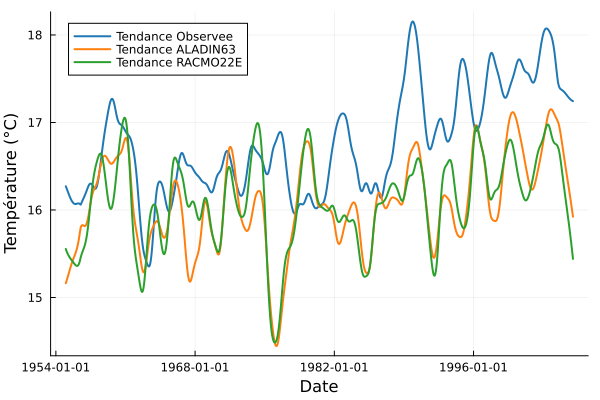

In [172]:
#plot(datats, alpha=:0.5, main = "Tendances", label="Série temporelle observée", xlabel="Date", ylabel="Température (°C)", legend=:topright)
#plot!(datats_drias,palette =:tab10,alpha=:0.5, label="Série temporelle ALADIN63", legend=:topright)
#plot!(datats_mod2,palette =:tab10,alpha=:0.5, label="Série temporelle RACMO22E", legend=:topright)
@df stl_df.decomposition plot(:Timestamp, :Trend, label="Tendance Observee",palette =:tab10, linewidth=2, xlabel="Date", ylabel="Température (°C)")
@df stl_df_drias.decomposition plot!(:Timestamp, :Trend, label="Tendance ALADIN63",palette =:tab10, linewidth=2)
@df stl_df_mod2.decomposition plot!(:Timestamp, :Trend, label="Tendance RACMO22E",palette =:tab10, linewidth=2)
#savefig("Tendances_Forecast.pdf")

Régréssion des tendances

In [173]:
using Plots
using DataFrames
using GLM
using Dates

function calculate_regression_lines(df::DataFrame; ref_date=Date(1955, 1, 1))
    # Convertir les dates en jours depuis une date de référence
    days_since_ref = Date.(df.Timestamp) .- ref_date
    days_since_ref = [Dates.value(day) for day in days_since_ref]

    # Ajouter la nouvelle colonne des jours depuis la date de référence
    df[!,:DaysSinceRef] = days_since_ref

    # Filtrer les données pour chaque période
    df_period1 = df[1955 .<= year.(df.Timestamp) .<= 1980, :]
    df_period2 = df[1980 .< year.(df.Timestamp) .<= 2005, :]

    # Effectuer la régression linéaire pour la première période
    model_period1 = lm(@formula(Trend ~ DaysSinceRef), df_period1)
    intercept_period1 = coef(model_period1)[1]
    slope_period1 = coef(model_period1)[2]

    # Effectuer la régression linéaire pour la deuxième période
    model_period2 = lm(@formula(Trend ~ DaysSinceRef), df_period2)
    intercept_period2 = coef(model_period2)[1]
    slope_period2 = coef(model_period2)[2]

    # Générer les valeurs de la droite de régression pour chaque période
    x_vals_period1 = df_period1.Timestamp
    x_vals_period2 = df_period2.Timestamp
    y_vals_period1 = intercept_period1 .+ slope_period1 .* df_period1.DaysSinceRef
    y_vals_period2 = intercept_period2 .+ slope_period2 .* df_period2.DaysSinceRef

    return (x_vals_period1, y_vals_period1, x_vals_period2, y_vals_period2)
end

# Exemple d'utilisation avec le DataFrame stl_df.decomposition
x_vals_period1, y_vals_period1, x_vals_period2, y_vals_period2 = calculate_regression_lines(stl_df.decomposition)
x_vals_period1_1, y_vals_period1_1, x_vals_period2_1, y_vals_period2_1 = calculate_regression_lines(stl_df_drias.decomposition)
x_vals_period1_2, y_vals_period1_2, x_vals_period2_2, y_vals_period2_2 = calculate_regression_lines(stl_df_mod2.decomposition)

# Tracer la série temporelle avec les deux tendances et les deux droites de régression
@df stl_df.decomposition plot(:Timestamp, :Trend, label="Tendance Observée", palette=:tab10, linewidth=2, xlabel="Date", ylabel="Température (°C)")
@df stl_df_drias.decomposition plot!(:Timestamp, :Trend, label="Tendance ALADIN63",palette =:tab10, linewidth=2)
@df stl_df_mod2.decomposition plot!(:Timestamp, :Trend, label="Tendance RACMO22E",palette =:tab10, linewidth=2)
plot!(x_vals_period1, y_vals_period1, linestyle=:dot, color=:blue, linewidth=2,label="Droites de régréssion")
plot!(x_vals_period2, y_vals_period2, linestyle=:dot, color=:blue, linewidth=2,label=false)
savefig("Tendances-Regression")



"/Users/mario/Changement_climatique/data/Tendances-Regression.png"

Comparaison des différentes méthodes des tendances

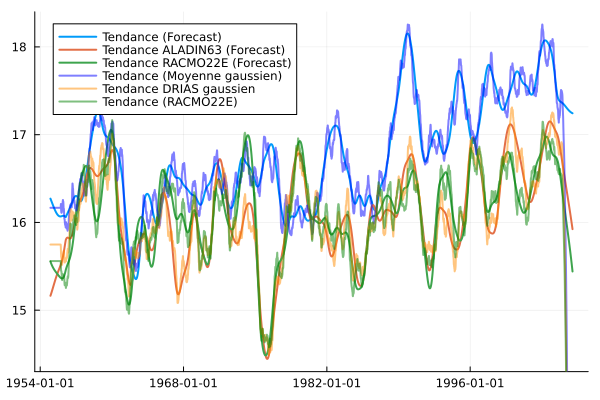

In [174]:
@df stl_df.decomposition plot(:Timestamp, :Trend,  main = "Tendances", label="Tendance (Forecast)",linewidth = 2)
@df stl_df_drias.decomposition plot!(:Timestamp, :Trend, label="Tendance ALADIN63 (Forecast)",linewidth = 2)
@df stl_df_mod2.decomposition plot!(:Timestamp, :Trend, label="Tendance RACMO22E (Forecast)",linewidth = 2)

plot!(df_daily.DATE, color=:blue,palette =:tab10, alpha=0.5, trend_gauss, label="Tendance (Moyenne gaussien)", linewidth=2)
plot!(df_daily_drias.Date,palette =:tab10, alpha=0.5, color=:darkorange, trend_gauss_drias, label="Tendance DRIAS gaussien", linewidth=2)
plot!(df_daily_mod2.Date, palette =:tab10, alpha=0.5,color=:green, trend_gauss_mod2, label="Tendance (RACMO22E)", linewidth=2)

#plot!(df_daily.DATE,color=:blue,  palette =:tab10, alpha=0.5,trend_values, label="Tendance (Moyenne mobile)", xlabel="Date", ylabel="Température (°C)")
#plot!(df_daily_drias.Date, color=:darkorange,palette =:tab10, alpha=0.5, trend_values_drias, label="Tendance ALADIN63")
#plot!(df_daily_mod2.Date,color=:green, palette =:tab10, alpha=0.5, trend_values_mod2, label="Tendance RACMO22E")
ylims!(14.3,18.4)
#savefig("Tendances_Forecast_Moyenne-Gaussien.pdf")

### SAISONNALITÉ

Calcul à la main d'une saisonnalité

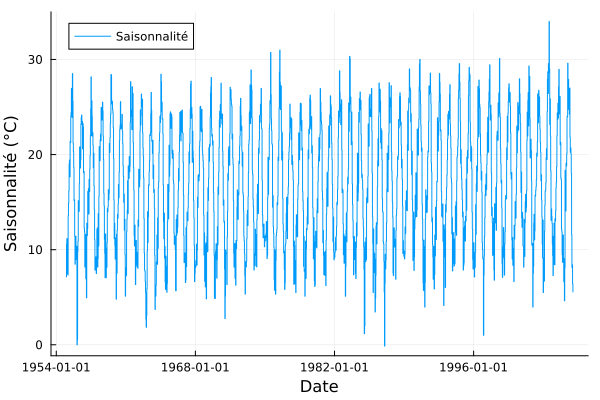

In [175]:

function saisonnalite(data::Vector{T}, period::Int) where T
    n = length(data)
    seasonal = similar(data, T) # Vecteur de la même taille et du meme type que data 
    seasonal_count = Int(ceil(n / period))
    
    seasonal_avg = similar(data, T)
    for i in 1:seasonal_count
        start_idx = (i - 1) * period + 1
        end_idx = min(i * period, n)
        seasonal_avg[start_idx:end_idx] .= mean(@view(data[start_idx:end_idx]))
    end
    
    for i in 1:n
        seasonal[i] = seasonal_avg[i]
    end
    
    return seasonal
end

# Calculer la saisonnalité avec une période saisonnière de 12 mois (par exemple)
seasonal_values = saisonnalite(df_daily.DAILY_MEAN, 12)

# Tracer la série temporelle de la saisonnalité
plot(df_daily.DATE, seasonal_values, label="Saisonnalité", xlabel="Date", ylabel="Saisonnalité (°C)")


Saisonnalité avec Forecast

In [205]:
@df stl_df.decomposition plot(:Timestamp, :Seasonal,  label = "Saisonnalité observée",palette =:tab10, xlabel="Date", ylabel="Température (°C)")
@df stl_df_drias.decomposition plot!(:Timestamp, :Seasonal, label="Saisonnalité ALADIN63",palette =:tab10)
@df stl_df_mod2.decomposition plot!(:Timestamp, :Seasonal, label="Saisonnalité RACMO22E",palette =:tab10)
savefig("Saisonnalité_Forecast.pdf")

"/Users/mario/Changement_climatique/data/Saisonnalité_Forecast.pdf"

Différence des saisonnalités

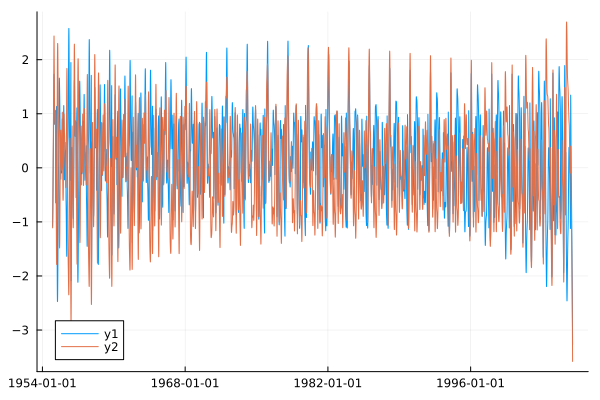

In [177]:
saisonnalite_diff_drias =  abs.(stl_df_drias.decomposition.Seasonal) - abs.(stl_df.decomposition.Seasonal)
plot(df_daily_drias.Date,saisonnalite_diff_drias)
saisonnalite_diff_mod2 = stl_df.decomposition.Seasonal - stl_df_mod2.decomposition.Seasonal
plot!(df_daily_mod2.Date,saisonnalite_diff_mod2)
# finalement rien de fou

### BRUIT

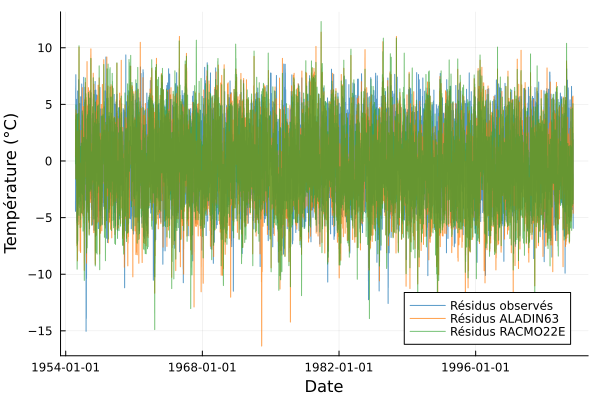

In [178]:

function retiresaisonnalite(data::Vector{T}) where T
    n = length(data)
    saisonnalite = stl_df.decomposition.Seasonal
    tendance = stl_df.decomposition.Trend
    
    for i in 1:n
        data[i] = data[i] - saisonnalite[i] - tendance[i]
    end
    
    return data
end

# Calculer la saisonnalité 
residus = retiresaisonnalite(df_daily.DAILY_MEAN)
residus_drias = retiresaisonnalite(df_daily_drias.DAILY_MEAN)
residus_mod2 = retiresaisonnalite(df_daily_mod2.DAILY_MEAN)

In [213]:
mean(residus)
mean(residus_drias)
mean(residus_mod2)

-0.6711877463685338

In [196]:

# Tracer la série temporelle de la saisonnalité
plot(df_daily.DATE, residus, label="Résidus observés",palette =:tab10, alpha = 0.8, xlabel="Date", ylabel="Température (°C)")
plot!(df_daily_drias.Date, residus_drias, label="Résidus ALADIN63",palette =:tab10, alpha = 0.65)
plot!(df_daily_mod2.Date, residus_mod2, label="Résidus RACMO22E",palette =:tab10, alpha = 0.55)
savefig("Résidus_Forecast.pdf")

"/Users/mario/Changement_climatique/data/Résidus_Forecast.pdf"

In [203]:
println(var(stl_df.decomposition.Seasonal))
println(var(stl_df_drias.decomposition.Seasonal))
println(var(stl_df_mod2.decomposition.Seasonal))
println("Variance des Résidus:")
println(var(residus))
println(var(residus_drias))
println(var(residus_mod2))

38.14348320450138
40.56508738888056
40.22586112235837
Variance des Résidus:
8.612946987750941
11.270314524868317
11.448482337868416


## Analyse des résidus

### Autocorrélogrammes de la série résiduelle

Autocorrélogramme partiel


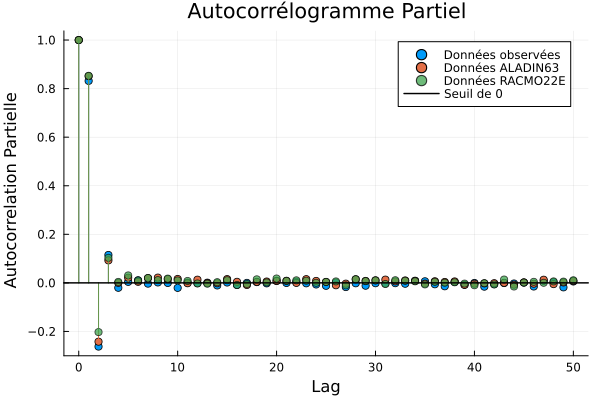

In [180]:
# Calculer l'autocorrélogramme partiel avec un nombre maximal de décalages spécifié
maxlag = 50 # Définir le nombre maximal de décalages
lags = collect(0:maxlag) # Créer une plage de décalages
pacf_values_res = StatsBase.pacf(residus, lags)
pacf_values_drias_res = StatsBase.pacf(residus_drias, lags)
pacf_values_mod2_res = StatsBase.pacf(residus_mod2, lags)

plot(0:maxlag, pacf_values_res, label = "Données observées", xlabel="Lag", ylabel=" Autocorrelation Partielle", title="Autocorrélogramme Partiel", markershape=:circle, line=:stem)
plot!(0:maxlag, pacf_values_drias_res, label = "Données ALADIN63", markershape=:circle, line=:stem)
plot!(0:maxlag, pacf_values_mod2_res, label = "Données RACMO22E", markershape=:circle, line=:stem, alpha = 0.75)
hline!([0], color=:black, linewidth=1.5, label = "Seuil de 0")
#savefig("Autocorrélogramme_Partiel.pdf")

Autocorrélogramme simple


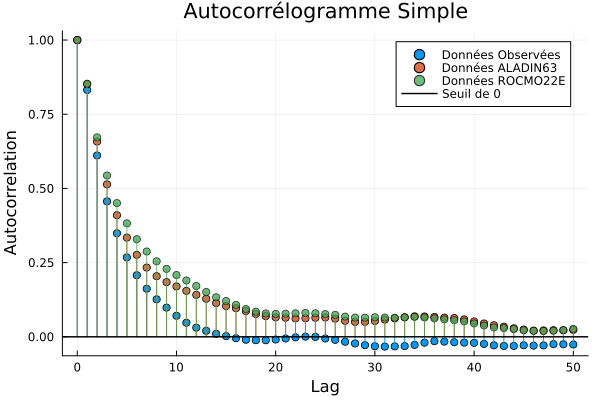

In [181]:
autocor_values = autocor(residus, lags)
autocor_values_drias = autocor(residus_drias, lags)
autocor_values_mod2 = autocor(residus_mod2, lags)

# Tracer l'autocorrélogramme empirique avec les points reliés à l'axe des abscisses et une droite d'équation nulle
plot(0:maxlag, autocor_values, label = "Données Observées", xlabel="Lag", ylabel="Autocorrelation", title="Autocorrélogramme Simple", markershape=:circle, line=:stem)
plot!(0:maxlag, autocor_values_drias, label = "Données ALADIN63", markershape=:circle, line=:stem)
plot!(0:maxlag, autocor_values_mod2, label = "Données ROCMO22E", markershape=:circle, line=:stem, alpha = 0.75)
hline!([0], color=:black, linewidth=1.5, label = "Seuil de 0")
#savefig("Autocorrélogramme_Empirique.pdf")

Estimation des coefficients de l'AR(2)

In [182]:
# Construire les matrices pour l'ajustement AR(2)
n = length(residus)
X = hcat(residus[2:end-1], residus[1:end-2])
X_drias = hcat(residus_drias[2:end-1], residus_drias[1:end-2])
X_mod2 = hcat(residus_mod2[2:end-1], residus_mod2[1:end-2])
y_target = residus[3:end]
y_target_drias = residus_drias[3:end]
y_target_mod2 = residus_mod2[3:end]

# Estimer les coefficients en utilisant les moindres carrés
coefficients = X \ y_target
coefficients_drias = X_drias \ y_target_drias
coefficients_mod2 = X_mod2 \ y_target_mod2


# Afficher les coefficients estimés
println("Coefficients estimés pour les observations : ", coefficients)
println("Coefficients estimés pour ALADIN63: ", coefficients_drias)
println("Coefficients estimés pour RACMO22E: ", coefficients_mod2)



Coefficients estimés pour les observations : [1.0500604585583677, -0.2623948082718128]
Coefficients estimés pour ALADIN63: [1.0614131713944308, -0.23814772273314275]
Coefficients estimés pour RACMO22E: [1.0293406022610931, -0.19906343953709005]


In [183]:

# Définir la fonction de vraisemblance
function log_likelihood(φ, data)
    n = length(data)
    residuals = zeros(n)
    for t in 4:n
        residuals[t] = data[t] - (φ[1]*data[t-1] + φ[2]*data[t-2] + φ[3]*data[t-3])
    end
    σ2 = mean(residuals[4:end].^2)
    logL = -n/2 * log(2π*σ2) - sum(residuals[4:end].^2) / (2*σ2)
    return -logL  # On retourne -logL pour la minimisation
end

# Initialiser les paramètres pour l'optimisation
φ_init = [0.0, 0.0, 0.0]

# Effectuer l'optimisation par maximum de vraisemblance
res = optimize(φ -> log_likelihood(φ, residus), φ_init, method = NelderMead())

# Extraire les coefficients estimés
φ_estimated = Optim.minimizer(res)

println("Coefficients estimés pour AR(3) : ", φ_estimated)

Coefficients estimés pour AR(3) : [1.0802426594664742, -0.3832186201324788, 0.11506978335252468]


Estimation des coefficients des AR avec Forecast


In [184]:
# Ajuster un modèle AR(1) sur les résidus
model_1 = ar(residus, 1)
model_drias_1 = ar(residus_drias, 1)
model_mod2_1 = ar(residus_mod2, 1)

# Afficher les résultats
println(model_1)
println(model_drias_1)
println(model_mod2_1)


Multivariate Autoregressive Model

    ar(X, order=1, constant=true)

Residuals Summary
┌──────────┬──────────┬──────────┬───────────┬─────────────┬─────────┬─────────┬─────────────┐
│ Variable │      Min │       1Q │    Median │        Mean │      3Q │     Max │   H0 Normal │
├──────────┼──────────┼──────────┼───────────┼─────────────┼─────────┼─────────┼─────────────┤
│       x1 │ -9.24977 │ -1.03693 │ 0.0761141 │ 9.55554e-17 │ 1.13336 │ 6.24008 │ 1.30417e-85 │
└──────────┴──────────┴──────────┴───────────┴─────────────┴─────────┴─────────┴─────────────┘
┌──────────┬─────────────┬──────────┬───────────┬──────────┐
│ Variable │        Mean │ Variance │  Skewness │ Kurtosis │
├──────────┼─────────────┼──────────┼───────────┼──────────┤
│       x1 │ 9.55554e-17 │  2.65313 │ -0.301621 │ 0.373852 │
└──────────┴─────────────┴──────────┴───────────┴──────────┘

Coefficients

Φ0
┌         ┐
│ 0.0     │
└         ┘
Φ1
┌           ┐
│ 0.832 *** │
└           ┘
Signif. codes:  0 ‘***’ 0.001 ‘**

In [185]:
# Ajuster un modèle AR(2) sur les résidus
model_2 = ar(residus, 2)
model_drias_2 = ar(residus_drias, 2)
model_mod2_2 = ar(residus_mod2, 2)

# Afficher les résultats
println(model_2)
println(model_drias_2)
println(model_mod2_2)


Multivariate Autoregressive Model

    ar(X, order=2, constant=true)

Residuals Summary
┌──────────┬──────────┬───────────┬───────────┬──────────────┬─────────┬─────────┬──────────────┐
│ Variable │      Min │        1Q │    Median │         Mean │      3Q │     Max │    H0 Normal │
├──────────┼──────────┼───────────┼───────────┼──────────────┼─────────┼─────────┼──────────────┤
│       x1 │ -8.97763 │ -0.976493 │ 0.0870672 │ -4.33932e-17 │ 1.06435 │ 5.72645 │ 2.81072e-116 │
└──────────┴──────────┴───────────┴───────────┴──────────────┴─────────┴─────────┴──────────────┘
┌──────────┬──────────────┬──────────┬───────────┬──────────┐
│ Variable │         Mean │ Variance │  Skewness │ Kurtosis │
├──────────┼──────────────┼──────────┼───────────┼──────────┤
│       x1 │ -4.33932e-17 │  2.47047 │ -0.339063 │ 0.475196 │
└──────────┴──────────────┴──────────┴───────────┴──────────┘

Coefficients

Φ0
┌         ┐
│ 0.0     │
└         ┘
Φ1
┌          ┐
│ 1.05 *** │
└          ┘
Φ2
┌            

In [186]:
# Ajuster un modèle AR(2) sur les résidus
model_3 = ar(residus, 3)
model_drias_3 = ar(residus_drias, 3)
model_mod2_3 = ar(residus_mod2, 3)

# Afficher les résultats
println(model_3)
println(model_drias_3)
println(model_mod2_3)


Multivariate Autoregressive Model

    ar(X, order=3, constant=true)

Residuals Summary
┌──────────┬────────┬───────────┬───────────┬──────────────┬─────────┬─────────┬──────────────┐
│ Variable │    Min │        1Q │    Median │         Mean │      3Q │     Max │    H0 Normal │
├──────────┼────────┼───────────┼───────────┼──────────────┼─────────┼─────────┼──────────────┤
│       x1 │ -8.829 │ -0.979993 │ 0.0882334 │ -1.05294e-16 │ 1.05689 │ 6.02582 │ 2.19097e-113 │
└──────────┴────────┴───────────┴───────────┴──────────────┴─────────┴─────────┴──────────────┘
┌──────────┬──────────────┬──────────┬───────────┬──────────┐
│ Variable │         Mean │ Variance │  Skewness │ Kurtosis │
├──────────┼──────────────┼──────────┼───────────┼──────────┤
│       x1 │ -1.05294e-16 │   2.4379 │ -0.330443 │ 0.481426 │
└──────────┴──────────────┴──────────┴───────────┴──────────┘

Coefficients

Φ0
┌         ┐
│ 0.0     │
└         ┘
Φ1
┌          ┐
│ 1.08 *** │
└          ┘
Φ2
┌            ┐
│ -0.383

In [187]:
# Ajuster un modèle AR(2) sur les résidus
model_4 = ar(residus, 4)
model_drias_4 = ar(residus_drias, 4)
model_mod2_4 = ar(residus_mod2, 4)

# Afficher les résultats
println(model_4)
println(model_drias_4)
println(model_mod2_4)

Multivariate Autoregressive Model

    ar(X, order=4, constant=true)

Residuals Summary
┌──────────┬──────────┬───────────┬───────────┬────────────┬─────────┬─────────┬──────────────┐
│ Variable │      Min │        1Q │    Median │       Mean │      3Q │     Max │    H0 Normal │
├──────────┼──────────┼───────────┼───────────┼────────────┼─────────┼─────────┼──────────────┤
│       x1 │ -8.80901 │ -0.980496 │ 0.0870812 │ 3.6149e-17 │ 1.05392 │ 6.00504 │ 1.56579e-113 │
└──────────┴──────────┴───────────┴───────────┴────────────┴─────────┴─────────┴──────────────┘
┌──────────┬────────────┬──────────┬───────────┬──────────┐
│ Variable │       Mean │ Variance │  Skewness │ Kurtosis │
├──────────┼────────────┼──────────┼───────────┼──────────┤
│       x1 │ 3.6149e-17 │  2.43703 │ -0.331282 │ 0.480054 │
└──────────┴────────────┴──────────┴───────────┴──────────┘

Coefficients

Φ0
┌         ┐
│ 0.0     │
└         ┘
Φ1
┌           ┐
│ 1.083 *** │
└           ┘
Φ2
┌            ┐
│ -0.391 *** │


In [188]:
function variance(data1::Vector,data2::Vector)
    x = 0 
    data3 = zeros(length(data2))
    for i in collect(1:length(data2))
    data3[i] = (data1[i] - data2[i])^2
    end
    x = sum(data3)
    return x
end

variance (generic function with 1 method)

In [189]:
x = variance(data_values, data_values_drias)
y = variance(data_values, data_values_mod2)
println("Score pour ALADIN63:", x)
println("Score pour RACMO22E:", y)

Score pour ALADIN63:379774.7401257156
Score pour RACMO22E:378852.03882407944


## Extrêmes

Vagues de chaleur

In [210]:

function moyenne_valeurs(df, start_date, end_date)
    subset = filter(row -> start_date <= row.DATE <= end_date, df)
    if nrow(subset) == 0
        return NaN  # Retourner NaN si aucune donnée n'est trouvée dans l'intervalle spécifié
    else
        return mean(subset.DAILY_MEAN)  # Utiliser la colonne DAILY_MEAN pour calculer la moyenne
    end
end

function moyenne_valeurs_drias(df, start_date, end_date)
    subset = filter(row -> start_date <= row.Date <= end_date, df)
    if nrow(subset) == 0
        return NaN  # Retourner NaN si aucune donnée n'est trouvée dans l'intervalle spécifié
    else
        return mean(subset.DAILY_MEAN)  # Utiliser la colonne DAILY_MEAN pour calculer la moyenne
    end
end

# Exemple d'utilisation :
start_date = Date(1995, 1, 1) 
end_date = Date(1995, 1, 15)
moyenne = moyenne_valeurs(df_daily, start_date, end_date)

function vagues_de_chaleur(df)

    moyennes_par_an = Float64[]  # Tableau pour stocker les moyennes par année
    
    for year in start_year:end_year
        moyennes_juin_aout = Float64[]  # Tableau pour stocker les moyennes de juin à août
        
        for day_offset in 0:15:75
            start_date = Date(year, 6, 1) + Day(day_offset)
            end_date = Date(year, 8, 31) - Day(75 - day_offset)
            
            push!(moyennes_juin_aout, moyenne_valeurs(df, start_date, end_date))
        end
        
        push!(moyennes_par_an, maximum(moyennes_juin_aout))
    end
    
    return moyennes_par_an
end

function vagues_de_chaleur_drias(df)
    start_year = 1955
    end_year = 2005
    moyennes_par_an = Float64[]  # Tableau pour stocker les moyennes par année
    
    for year in start_year:end_year
        moyennes_juin_aout = Float64[]  # Tableau pour stocker les moyennes de juin à août
        
        for day_offset in 0:15:75
            start_date = Date(year, 6, 1) + Day(day_offset)
            end_date = Date(year, 8, 31) - Day(75 - day_offset)
            
            push!(moyennes_juin_aout, moyenne_valeurs_drias(df, start_date, end_date))  # Utiliser moyenne_valeurs avec les données DRiAS
        end
        
        push!(moyennes_par_an, maximum(moyennes_juin_aout))
    end
    
    return moyennes_par_an
end

start_year = 1955
end_year = 2005

vagues = vagues_de_chaleur(df_daily)
vagues_drias = vagues_de_chaleur_drias(df_daily_drias)
vagues_mod2 = vagues_de_chaleur_drias(df_daily_mod2)
plot(start_year:end_year,vagues, label = "Données observées", xlab = "Temps (Années)", ylab = "Température (°C)", linestyle=:solid, marker=:circle, markersize=:2)
plot!(start_year:end_year,vagues_drias, label = "Données ALADIN63")
plot!(start_year:end_year,vagues_mod2, label = "Données RACMO22E")
savefig("vagues_de_chaleur.pdf")

"/Users/mario/Changement_climatique/data/vagues_de_chaleur.pdf"